作法
1. `df_total` 由(train,test,implicit)三組原始資料依照(原始分數,-1,0)合成
2. `gdf_user` 統計(User-ID,看過書的數量)並作圖
3. `gdf_book` 統計(ISBN,看過人數)並作圖

結論
1. `gdf_user`,`gdf_book`看起來都像Exponential distribution
    + 排名前面的user看過非常多書，書也類似
2. 之後想寫的程式
    1. `as_lod` (dataframe as list of dict)
        + 對書被評分的序列之類資料做處理方便
    2. `list_to_stats` 方便把一條評分序列「壓扁」

**l2r.plot.SimpleBar** 好用語法

`from learning2read.plot import SimpleBar
pobj = SimpleBar()
pobj.setup(dataframe)
pobj.add('x_axis_name','y_axis_name')
pobj # auto plot in jupyter`

**defaultdict** 好用語法

`from collections import defaultdict
book_rating_dict = defaultdict(lambda:{'num_user':0,'rating_list':[]})
book_rating_dict[ISBN]['num_user']+=1`

**pandas** 好用語法
+ Series
+ DataFrame
    + `df.describe()`
    + `df['column_name']` to Series
    + `df.to_dict('record')` to List of Dict
    + `df.iloc[:100,:]` first 100 row
    + `df.loc[df['x']>5,:]` select rows that x gt 5
    + `df.apply(...)`
    + `df.concat(...)`
+ DataFrameGroupBy
    + `dfg.describe`
    + `dfg.agg`

# Load

In [59]:
import learning2read as l2r
l2r.reload_all() # for module developing

In [8]:
import pandas as pd
import numpy as np
import scipy
from learning2read.utils import DataLoader

In [9]:
def Data(key,**kwargs):
    return DataLoader(r"/Users/qtwu/Downloads/data").load(key,**kwargs)
raw_user=Data("user")
raw_book=Data("books")
raw_train=Data("brtrain")
raw_test=Data("brtest")
raw_implicit=Data("brimplicit")
raw_submit=Data("submit",index_col=None,header=None)
raw_user.shape, raw_book.shape, raw_train.shape, raw_test.shape, raw_implicit.shape, raw_submit.shape

/Users/qtwu/Downloads/data/users.csv
/Users/qtwu/Downloads/data/books.csv
/Users/qtwu/Downloads/data/book_ratings_train.csv
/Users/qtwu/Downloads/data/book_ratings_test.csv
/Users/qtwu/Downloads/data/implicit_ratings.csv
/Users/qtwu/Downloads/data/submission.csv


((278858, 3), (271379, 9), (260202, 3), (173469, 2), (716109, 3), (173469, 1))

# Explore Train/Test/Implicit

`df_total`
+ Train: $rating\geq 1$
+ Implicit: $rating=0$
+ Test: $rating=-1$

In [10]:
df_test_neg1=raw_test.copy()
df_test_neg1['Book-Rating']=-1 # scalar as column
df_total=pd.concat([raw_train,raw_implicit,df_test_neg1],axis=0)
print(df_total.shape)
df_total.sample(5)

(1149780, 3)


,Book-Rating,ISBN,User-ID
673094,0,0440005868,e6ecba7816
90586,-1,0312099436,578f9fa321
215660,8,0452268060,bf23af9e8c
538800,0,0824521331,add393bee0
313780,0,0340416386,d82588beb1


## group by User-ID

### users.csv intersection & union

> 
**Conclusion** user_with_rating$\subseteq$user_in_csv  
提供的user有17萬筆沒出現在任何一種評分檔裡面，完全不知道來幹嘛的XD

In [11]:
user_with_rating = set(df_total['User-ID'].unique())
user_in_csv      = set(raw_user['User-ID'].unique())
len(user_with_rating), len(user_in_csv)

(105283, 278858)

In [12]:
( len(set.intersection(user_with_rating,user_in_csv)),
len(set.union(user_with_rating,user_in_csv)) )

(105283, 278858)

### User's books

`dfg_XXX # DataFrame -> DataFrameGroupBy`  
`gdf_XXX # DataFrameGroupBy -> DataFrame (grouped data frame)`

In [13]:
dfg_user=df_total.groupby('User-ID')
print(dfg_user.ngroups) # equals `len(df_total['User-ID'].unique())`
gdf_user=dfg_user.agg({'Book-Rating':['count','min','max']})
gdf_user.columns=['count','min','max'] # cancel multilevel index
gdf_user.sample(5)

105283


,count,min,max
User-ID,,,
27b440431d,1,7,7
565294a2a5,1,10,10
2e6a19bd8c,1,0,0
9554c8625b,1,-1,-1
a356a60fea,6,0,0


#### less than 10 books

In [90]:
from learning2read.utils import as_lod
from learning2read.plot import SimpleBar

def plot_user_bar(df):
    plot=SimpleBar()
    plot.setup(as_lod(df),use_slider=True)
    plot.add(fvalue=lambda r:[r['index'],r['count']],
             ftooltip=lambda r:{
                 'formatter':'<br>'.join([
                     'User-ID: %s'%(r['index']),
                     'count: %d'%(r['count']),
                     'min: %d'%(r['min']),
                     'max: %d'%(r['max']),
                 ])
             },)
    return plot

In [91]:
gdf_user_less_books=gdf_user.loc[gdf_user['count']<25, :]

print(gdf_user_less_books.shape)
gdf_user_less_books=gdf_user_less_books.sample(5000)
gdf_user_less_books=gdf_user_less_books.sort_values('count',ascending=False)
plot_user_bar(gdf_user_less_books)

(99138, 3)


##### 靜態圖

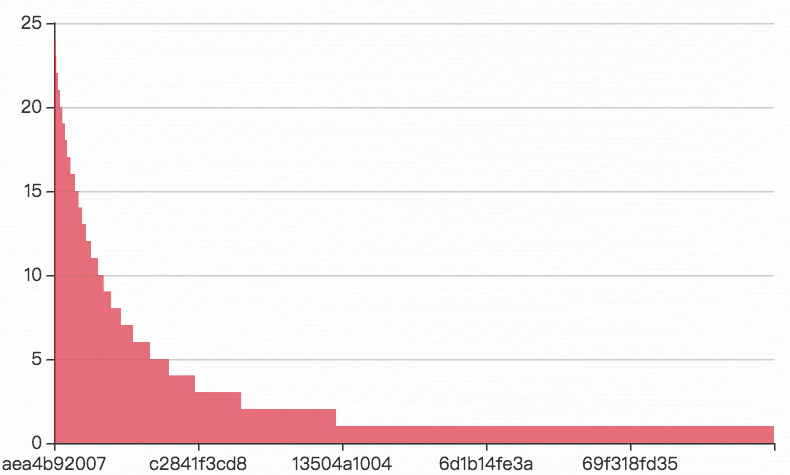

#### $\geq$ 25 books

In [92]:
gdf_user_more_books=gdf_user.loc[gdf_user['count']>=25, :]

print(gdf_user_more_books.shape)
# gdf_user_more_books=gdf_user_more_books.sample(3000)
gdf_user_more_books=gdf_user_more_books.sort_values('count',ascending=False)
plot_user_bar(gdf_user_more_books)

(6145, 3)


##### 靜態圖

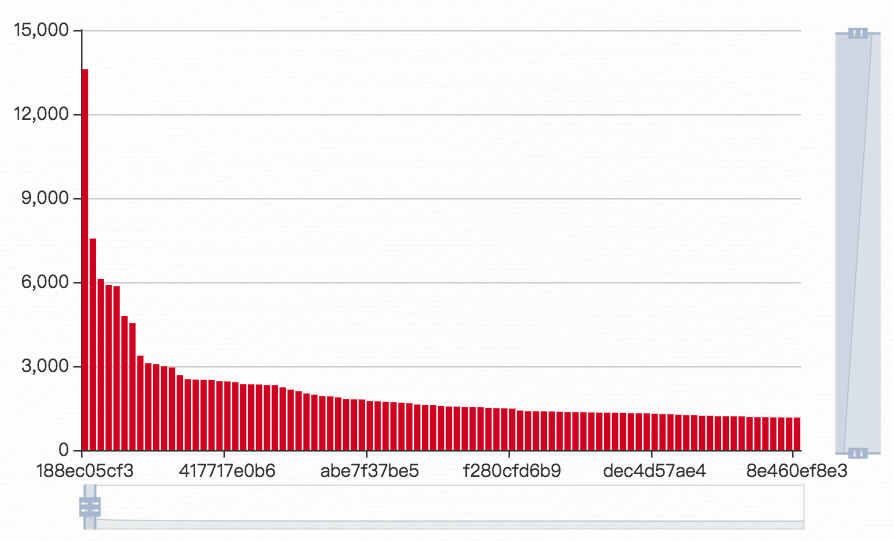

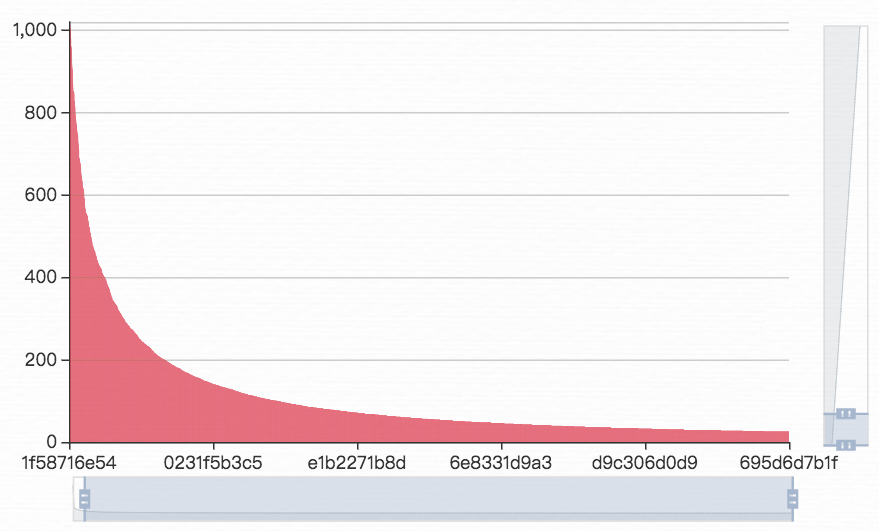

## group by ISBN

In [96]:
dfg_book=df_total.groupby('ISBN')
gdf_book=dfg_book.agg({'Book-Rating':['count','min','max']})
gdf_book.columns=['count','min','max'] # cancel multilevel index
gdf_book.sort_values('count',ascending=False).iloc[:5,:]

,count,min,max
ISBN,,,
0971880107,2502,-1,10
0316666343,1295,-1,10
0385504209,883,-1,10
0060928336,732,-1,10
0312195516,723,-1,10


In [98]:
# from learning2read.utils import as_lod
# from collections import defaultdict
# book_rating_dict = defaultdict(lambda:{'num_user':0,'rating_list':[]})
# for r in as_lod(df_total):
#     book_rating_dict[r['ISBN']]['num_user']+=1
#     book_rating_dict[r['ISBN']]['rating_list'].append(r['Book-Rating'])

In [99]:
def plot_book_bar(df):
    plot=SimpleBar()
    plot.setup(as_lod(df),use_slider=True)
    plot.add(fvalue=lambda r:[r['index'],r['count']],
             ftooltip=lambda r:{
                 'formatter':'<br>'.join([
                     'ISBN: %s'%(r['index']),
                     'count: %d'%(r['count']),
                     'min: %d'%(r['min']),
                     'max: %d'%(r['max']),
                 ])
             },)
    return plot

#### $<$ 25 users

In [105]:
gdf_book_sub = gdf_book.loc[gdf_book['count']<25, :]
print(gdf_book_sub.shape)

gdf_book_sub = gdf_book_sub.sample(3000)
gdf_book_sub = gdf_book_sub.sort_values('count', ascending=False)
plot_book_bar(gdf_book_sub)

(334945, 3)


##### 靜態圖

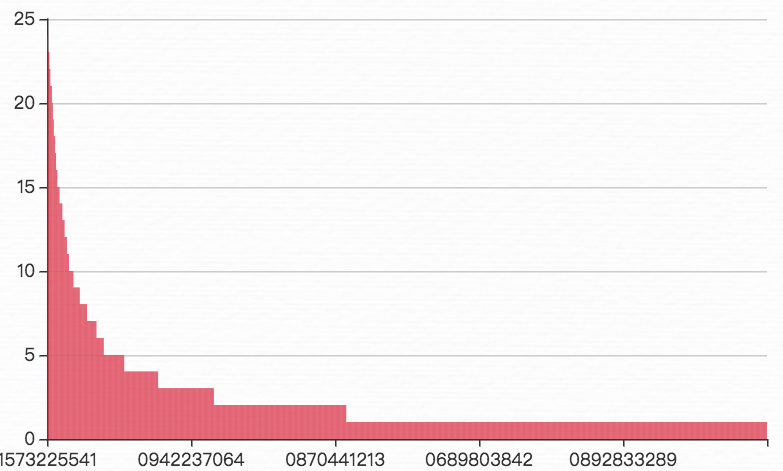

#### $\geq$ 25 users

In [103]:
gdf_book_sub = gdf_book.loc[gdf_book['count']>=25, :]
print(gdf_book_sub.shape)

gdf_book_sub=gdf_book_sub.sort_values('count',ascending=False)
plot_book_bar(gdf_book_sub)

(5611, 3)


##### 靜態圖

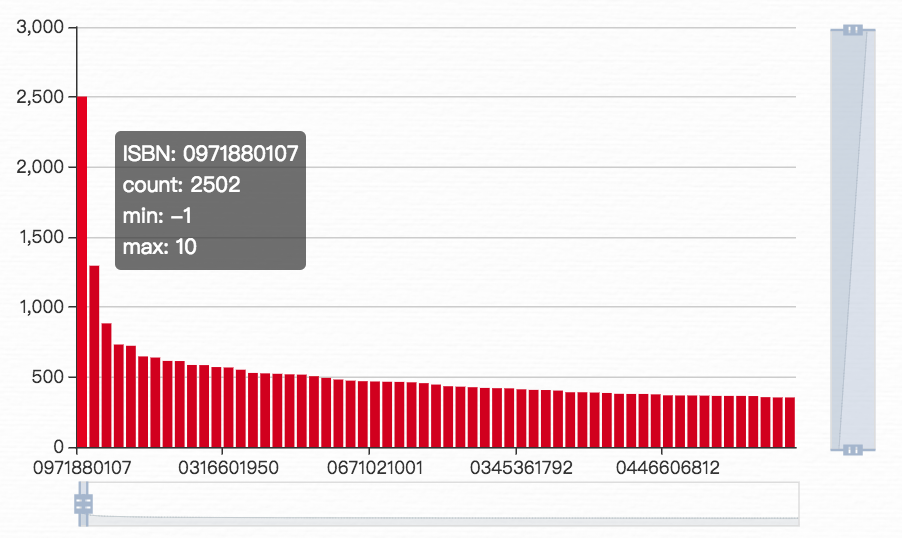

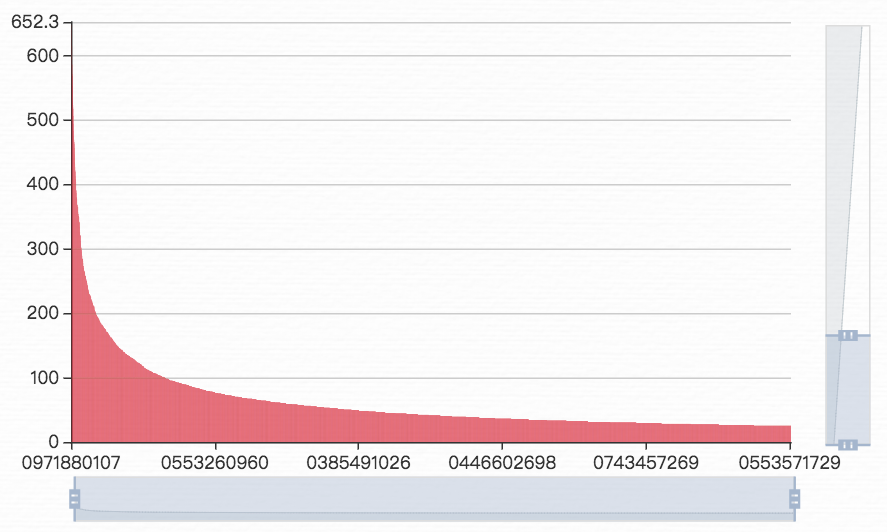

***

#### 之後詳細寫，按publisher分組

In [ ]:
# st=pd.get_option('display.max_colwidth')
# pd.set_option('display.max_colwidth',-1)
# # area
# raw_book.loc[:,:'Publisher'].sample(100)

In [106]:
# pd.set_option('display.max_rows',300)
# dfg=raw_book.groupby("Publisher")
# gdf=dfg.agg({'ISBN':'count'})
# gdf.columns=['count']
# # gdf=gdf.loc[gdf['count']>1,:]
# gdf=gdf.sort_values('count',ascending=False)
# gdf.iloc[:10,:]

`homework` 我自己本機讓jupyter變漂亮的套件 :p（請註解之）

In [108]:
import homework
from homework import *
reload(homework)
pass

<IPython.core.display.Javascript object>

$\def \t {\text}
\def \sp {\space}
\def \spc {\space\space\space}
\def \spe {\space\space\space\space\space}
\def \bc {\because}
\def \A {\mathcal{A}}
\def \H {\mathcal{H}}
\def \m {\mathcal{m}}
\def \R {\mathbb{R}}
\def \N {\mathbb{N}}
\def \Z {\mathbb{Z}}
\def \Q {\mathbb{Q}}
\def \C {\mathbb{C}}
\def \say {\underbrace}
\def \L {\mathbb{L}}
\def \P {\mathbb{P}}
\def \F {\mathbb{F}}
\def \sbc {\spc\because}
\def \sbe {\spe\because}
\def \defeq {\overset{def}{=}}
\def \ctr {\rightarrow\leftarrow}
\def \st {\t{ such that }}
\def \inner#1 #2{\langle #1 \mid #2 \rangle}
\def \norm#1{\lVert #1 \rVert}
\def \bm#1 {\begin{bmatrix} #1 \end{bmatrix}}
\def \pt {\partial}
\def \ppt#1 #2{\frac{\pt #1}{\pt #2}}
\def\l {\mathscr{l}}
\def \vphi {\varphi}$


<IPython.core.display.Javascript object>

$\def \t {\text}
\def \sp {\space}
\def \spc {\space\space\space}
\def \spe {\space\space\space\space\space}
\def \bc {\because}
\def \A {\mathcal{A}}
\def \H {\mathcal{H}}
\def \m {\mathcal{m}}
\def \R {\mathbb{R}}
\def \N {\mathbb{N}}
\def \Z {\mathbb{Z}}
\def \Q {\mathbb{Q}}
\def \C {\mathbb{C}}
\def \say {\underbrace}
\def \L {\mathbb{L}}
\def \P {\mathbb{P}}
\def \F {\mathbb{F}}
\def \sbc {\spc\because}
\def \sbe {\spe\because}
\def \defeq {\overset{def}{=}}
\def \ctr {\rightarrow\leftarrow}
\def \st {\t{ such that }}
\def \inner#1 #2{\langle #1 \mid #2 \rangle}
\def \norm#1{\lVert #1 \rVert}
\def \bm#1 {\begin{bmatrix} #1 \end{bmatrix}}
\def \pt {\partial}
\def \ppt#1 #2{\frac{\pt #1}{\pt #2}}
\def\l {\mathscr{l}}
\def \vphi {\varphi}$
